In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob

import IPython.display as ipd
from tqdm import tqdm
import librosa
import librosa.display

from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
hakuna_path = '/content/drive/MyDrive/ML_mini_project/Hakuna/*.wav'
file_1 = glob.glob(hakuna_path)
hakuna_path = '/content/drive/MyDrive/ML_mini_project/Hakuna/*.Wav'
file_2 = glob.glob(hakuna_path)
hakuna_path = '/content/drive/MyDrive/ML_mini_project/Hakuna/*.WAV'
file_3 = glob.glob(hakuna_path)
hakuna_file = file_1+file_2+file_3
print(f"Total number of Hakuna: {len(hakuna_file)}")

panther_path = '/content/drive/MyDrive/ML_mini_project/Panther/*.wav'
file_4 = glob.glob(panther_path)
panther_file = file_4[:30]
print(f"Total number of Panther: {len(panther_file)}")
all_songs = hakuna_file + panther_file

Total number of Hakuna: 416
Total number of Panther: 30


In [ ]:
MLENDHW_table = [] 
song = []
for file in hakuna_file:
  file_name = 'Hakuna'
  file_names = file.split('/')[-1]
  MLENDHW_table.append([file_name])
  song.append(file_name)

In [ ]:
for file in panther_file:
  file_name = 'Panther'
  file_names = file.split('/')[-1]
  MLENDHW_table.append([file_name])
  song.append(file_name)

# print(MLENDHW_table)
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['song'])
MLENDHW_df

,song
0,Hakuna
1,Hakuna
2,Hakuna
3,Hakuna
4,Hakuna
...,...
441,Panther
442,Panther
443,Panther
444,Panther


Play the songs to understand the samples better. Listen to both songs.

In [ ]:
# Play Hakuna
display(ipd.Audio(all_songs[25]))
display(ipd.Audio(all_songs[30]))

In [ ]:
# Play Panther
display(ipd.Audio(all_songs[428]))
display(ipd.Audio(all_songs[444]))

## Feature extraction
### Tempo and beats


In [ ]:
tempo_hp = []
for file in tqdm(all_songs):
  y, sr = librosa.load(file, offset=2.0, duration=10.0)
  tempo, beats = librosa.beat.beat_track(y, sr)
  tempo_hp.append(tempo)

100%|██████████| 446/446 [03:47<00:00,  1.96it/s]


In [ ]:
pickle.dump(tempo_hp, open( "tempo_hp.p", "wb" ))
# tempo_hp = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/tempo_hp.p", "rb"))

In [ ]:
df_plottempo = pd.DataFrame([pd.Series(tempo_hp,name='tempo'),pd.Series(song,name='song')]).T
print(df_plottempo)

       tempo     song
0    151.999   Hakuna
1    107.666   Hakuna
2    151.999   Hakuna
3    117.454   Hakuna
4    172.266   Hakuna
..       ...      ...
441  129.199  Panther
442  80.7495  Panther
443  117.454  Panther
444  123.047  Panther
445  69.8374  Panther

[446 rows x 2 columns]


Text(0.5, 1.0, 'tempo')

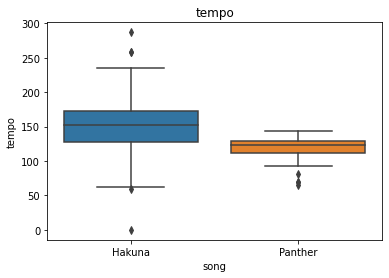

In [ ]:
sns.boxplot(x = 'song', y = 'tempo', data = df_plottempo).set_title('tempo')

###  MFCCs (Mel Frequency Cepstral Coefficents)
 

In [ ]:
mfcc_hp=[]
for file in tqdm(all_songs):
  y, sr = librosa.load(file, offset=2.0, duration=7.9)
  mfccs = librosa.feature.mfcc(y=y, sr=sr)
  mfcc_hp.append(mfccs)

100%|██████████| 446/446 [02:48<00:00,  2.64it/s]


MFCCs of Hakuna

[Text(0.5, 1.0, 'MFCC')]

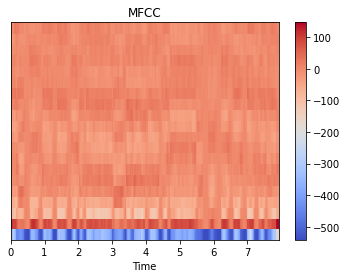

In [ ]:
# Hakuna
fig, ax = plt.subplots()
img = librosa.display.specshow(mfcc_hp[2], x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

[Text(0.5, 1.0, 'MFCC')]

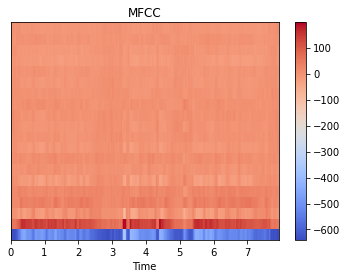

In [ ]:
# Hakuna
fig, ax = plt.subplots()
img = librosa.display.specshow(mfcc_hp[45], x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

MFCCs of Panther

[Text(0.5, 1.0, 'MFCC')]

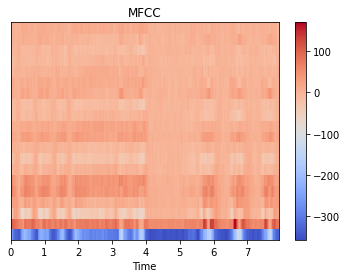

In [ ]:
# Panther
fig, ax = plt.subplots()
img = librosa.display.specshow(mfcc_hp[420], x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

[Text(0.5, 1.0, 'MFCC')]

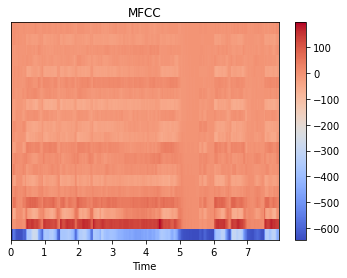

In [ ]:
# Panther
fig, ax = plt.subplots()
img = librosa.display.specshow(mfcc_hp[444], x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

### Spectral centroid



In [ ]:
spectral_centroid = []
for file in tqdm(all_songs):
  x, fs = librosa.load(file, offset=2.0, duration=7.9)
  centroid = librosa.feature.spectral_centroid(y=x, sr=fs, n_fft=2048, hop_length=512, center=True)
  spectral_centroid.append(np.ravel(centroid))

100%|██████████| 446/446 [02:31<00:00,  2.94it/s]


In [ ]:
pickle.dump(spectral_centroid, open("spectral_centroid_hp.p", "wb" ))
# spectral_centroid = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/spectral_centroid_hp.p", "rb"))

In [ ]:
df_centroid = pd.DataFrame(spectral_centroid)
df_yc = pd.DataFrame(song, columns =['song'])
df_cent = pd.concat([df_centroid,df_yc],axis=1)
print(df_cent)

               0            1            2  ...          339          340     song
0     934.890125   961.632948  1016.765082  ...  1092.963265   967.911198   Hakuna
1    1182.232200  1117.855039   906.837826  ...  1653.811434  1406.367469   Hakuna
2    1808.528905  1566.914625  1152.774738  ...  1355.636116  1435.823134   Hakuna
3    1365.434707  1314.916519  1445.669813  ...   974.723919   742.294961   Hakuna
4    1938.998875  2127.650597  2213.125917  ...  1675.816039  1718.921981   Hakuna
..           ...          ...          ...  ...          ...          ...      ...
441  2214.913519  2062.423963  2130.636180  ...   951.694793   894.912375  Panther
442  1638.656856  1666.678011  1802.127570  ...  1529.260679  1642.926167  Panther
443  1206.448016   836.791946   364.846731  ...   509.222612   612.491462  Panther
444  2631.517306  3015.197759  3518.792282  ...  1007.560251   899.444330  Panther
445   751.972851   746.564741   801.034261  ...   557.542594   561.121608  Panther

[44

Spectral centroid of Hakuna

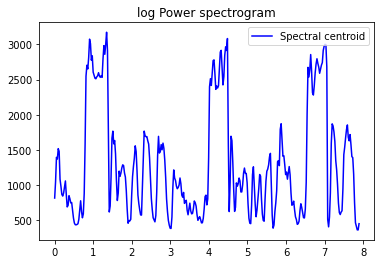

In [ ]:
times = librosa.times_like(spectral_centroid[20])
fig, ax = plt.subplots()
ax.plot(times, spectral_centroid[20].T, label='Spectral centroid', color='b')
ax.legend(loc='upper right')
ax.set(title='log Power spectrogram')
display(ipd.Audio(all_songs[20]))

Spectral centroid of Panther

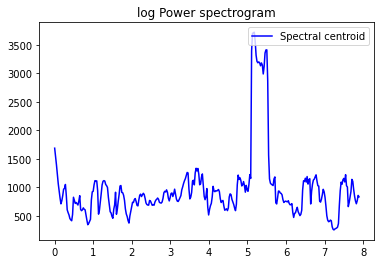

In [ ]:
times = librosa.times_like(spectral_centroid[427])
fig, ax = plt.subplots()
ax.plot(times, spectral_centroid[427].T, label='Spectral centroid', color='b')
ax.legend(loc='upper right')
ax.set(title='log Power spectrogram')
display(ipd.Audio(all_songs[427]))

### Pitch and power


In [ ]:
pitch_mean=[]
pitch_std=[]
power = []
for file in tqdm(all_songs):
  x, fs = librosa.load(file, offset=2.0, duration=7.9)
  winLen=0.02
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length()) 
  hop_length = frame_length//2                                                             
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                               frame_length=frame_length,hop_length=hop_length)
  pitch_m = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
  pitch_s  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
  p = np.sum(x**2)/len(x)

  pitch_mean.append(pitch_m)
  pitch_std.append(pitch_s)
  power.append(p)

100%|██████████| 446/446 [11:23<00:00,  1.53s/it]


In [ ]:
pickle.dump(pitch_mean, open("pitch_mean_hp.p", "wb"))
pickle.dump(pitch_std, open("pitch_std_hp.p", "wb"))
pickle.dump(power, open("power_hp.p", "wb"))
# pitch_mean = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/pitch_mean_hp.p", "rb"))
# pitch_std = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/pitch_std_hp.p", "rb"))
# power = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/power_hp.p", "rb"))

In [ ]:
df_plotX = pd.DataFrame([pd.Series(pitch_mean,name='pitch_mean'),pd.Series(pitch_std,name='pitch_std'), pd.Series(power,name='power')]).T
df_ploty = pd.DataFrame(song, columns =['song'])
df_pitch = pd.concat([df_plotX,df_ploty],axis=1)
print(df_plotX)

     pitch_mean  pitch_std     power
0    135.238171  16.635422  0.003072
1    154.357112  20.462849  0.000256
2    390.356862  42.362975  0.009109
3    153.632035  36.608028  0.000228
4    269.264180  29.026382  0.002124
..          ...        ...       ...
441  235.940637  51.844447  0.008357
442  398.214889  31.580726  0.000997
443  206.979535  44.192668  0.007556
444  132.806112  28.772210  0.001749
445  203.005009  33.581580  0.000631

[446 rows x 3 columns]


Text(0.5, 1.0, 'power')

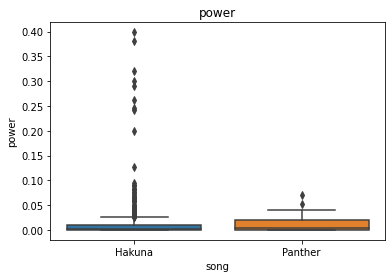

In [ ]:
sns.boxplot(x = 'song', y = 'power', data = df_pitch).set_title('power')

Text(0.5, 1.0, 'pitch_mean')

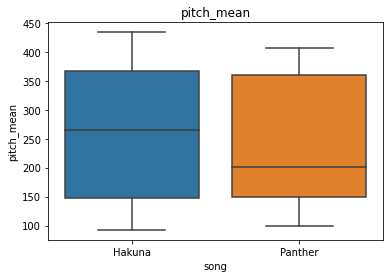

In [ ]:
sns.boxplot(x = 'song', y = 'pitch_mean', data = df_pitch).set_title('pitch_mean')

Text(0.5, 1.0, 'pitch_std')

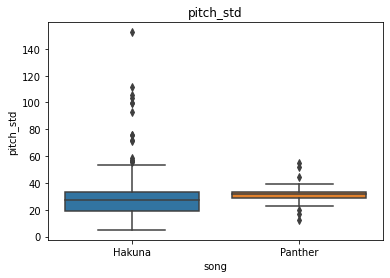

In [ ]:
sns.boxplot(x = 'song', y = 'pitch_std', data = df_pitch).set_title('pitch_std')

### Harmonics


In [ ]:
# harmonics
harmonic_hp=[]
for file in tqdm(all_songs[:2]):
  x, fs = librosa.load(file, offset=2.0, duration=10.0)
  # Compute the time-varying tempogram and average over time
  tempi = np.mean(librosa.feature.tempogram(y=x, sr=fs), axis=1)
  # We'll measure the first five harmonics
  h_range = [1, 2, 3, 4, 5]
  f_tempo = librosa.tempo_frequencies(len(tempi), sr=fs)
  t_harmonics = librosa.interp_harmonics(tempi, f_tempo, h_range)
  harmonic_hp.append(t_harmonics)
for file in tqdm(all_songs[444:]):
  x, fs = librosa.load(file, offset=2.0, duration=10.0)
  # Compute the time-varying tempogram and average over time
  tempi = np.mean(librosa.feature.tempogram(y=x, sr=fs), axis=1)
  # We'll measure the first five harmonics
  h_range = [1, 2, 3, 4, 5]
  f_tempo = librosa.tempo_frequencies(len(tempi), sr=fs)
  t_harmonics = librosa.interp_harmonics(tempi, f_tempo, h_range)
  harmonic_hp.append(t_harmonics)


100%|██████████| 2/2 [00:01<00:00,  1.80it/s]


[[<matplotlib.axis.YTick at 0x7f3162f60050>,
 [Text(0, 0, '1'),
  Text(0, 0, '2'),
  Text(0, 0, '3'),
  Text(0, 0, '4'),
  Text(0, 0, '5')],
 Text(0, 0.5, 'Harmonic'),
 Text(0.5, 0, 'Tempo (BPM)')]

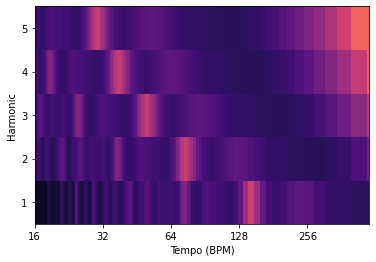

In [ ]:
# Hakuna
fig, ax = plt.subplots()
librosa.display.specshow(harmonic_hp[0], x_axis='tempo', sr=fs, ax=ax)
ax.set(yticks=0.5 + np.arange(len(h_range)),
      yticklabels=['{:.3g}'.format(_) for _ in h_range],
       ylabel='Harmonic', xlabel='Tempo (BPM)')

[[<matplotlib.axis.YTick at 0x7f3162ecb210>,
 [Text(0, 0, '1'),
  Text(0, 0, '2'),
  Text(0, 0, '3'),
  Text(0, 0, '4'),
  Text(0, 0, '5')],
 Text(0, 0.5, 'Harmonic'),
 Text(0.5, 0, 'Tempo (BPM)')]

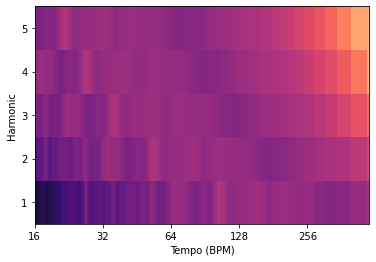

In [ ]:
# Hakuna
fig, ax = plt.subplots()
librosa.display.specshow(harmonic_hp[1], x_axis='tempo', sr=fs, ax=ax)
ax.set(yticks=0.5 + np.arange(len(h_range)),
      yticklabels=['{:.3g}'.format(_) for _ in h_range],
       ylabel='Harmonic', xlabel='Tempo (BPM)')

[[<matplotlib.axis.YTick at 0x7f3162fa0990>,
 [Text(0, 0, '1'),
  Text(0, 0, '2'),
  Text(0, 0, '3'),
  Text(0, 0, '4'),
  Text(0, 0, '5')],
 Text(0, 0.5, 'Harmonic'),
 Text(0.5, 0, 'Tempo (BPM)')]

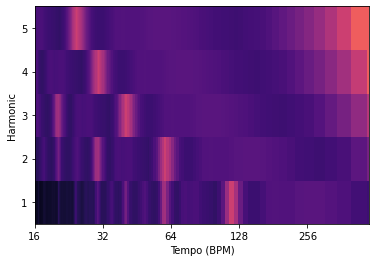

In [ ]:
# Panther
fig, ax = plt.subplots()
librosa.display.specshow(harmonic_hp[2], x_axis='tempo', sr=fs, ax=ax)
ax.set(yticks=0.5 + np.arange(len(h_range)),
      yticklabels=['{:.3g}'.format(_) for _ in h_range],
       ylabel='Harmonic', xlabel='Tempo (BPM)')

[[<matplotlib.axis.YTick at 0x7f3162edb750>,
 [Text(0, 0, '1'),
  Text(0, 0, '2'),
  Text(0, 0, '3'),
  Text(0, 0, '4'),
  Text(0, 0, '5')],
 Text(0, 0.5, 'Harmonic'),
 Text(0.5, 0, 'Tempo (BPM)')]

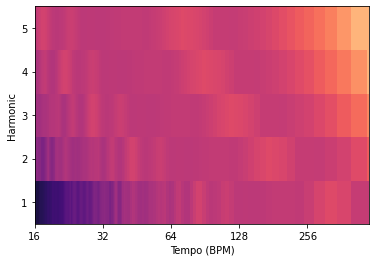

In [ ]:
# Panther
fig, ax = plt.subplots()
librosa.display.specshow(harmonic_hp[3], x_axis='tempo', sr=fs, ax=ax)
ax.set(yticks=0.5 + np.arange(len(h_range)),
      yticklabels=['{:.3g}'.format(_) for _ in h_range],
       ylabel='Harmonic', xlabel='Tempo (BPM)')

### Fast Fourier Transform


In [ ]:
# fft
fft_hp = []
fft_time=[]
for file in tqdm(all_songs):
  x, fs = librosa.load(file, offset=2.0, duration=7.9)
  fft_time.append(x)
  fourier_transform = np.fft.fft(x, n=None, axis=- 1, norm=None)
  fft_hp.append(fourier_transform)

100%|██████████| 446/446 [02:33<00:00,  2.91it/s]


In [ ]:
pickle.dump(fft_hp, open("fft_hp.p", "wb"))
# fft_hp = pickle.load(open("/content/drive/MyDrive/ML_mini_project/Preprocessed(X,y)/fft_hp.p", "rb"))

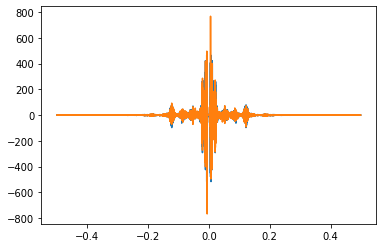

In [ ]:
# visualize fft
t = fft_time[0]
sp = np.fft.fft(np.sin(t))
freq = np.fft.fftfreq(t.shape[-1])
plt.plot(freq, sp.real, freq, sp.imag)
plt.show()


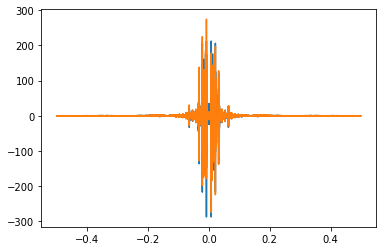

In [ ]:
t = fft_time[445]
sp = np.fft.fft(np.sin(t))
freq = np.fft.fftfreq(t.shape[-1])
plt.plot(freq, sp.real, freq, sp.imag)
plt.show()

## Split the data


In [ ]:
df_X = pd.DataFrame([tempo_hp,pitch_mean,pitch_std,power,spectral_centroid,fft_hp])
df_song = pd.DataFrame([song]).T
df_X = df_X.T.set_axis(['tempo_hp','pitch_mean','pitch_std','power','spectral_centroid','fft_hp'], axis=1, inplace=False)

In [ ]:
df_X

,tempo_hp,pitch_mean,pitch_std,power,spectral_centroid,fft_hp
0,151.999,135.238,16.6354,0.00307155,"[934.8901250398346, 961.6329483840143, 1016.76...","[(-3.599453535493936+0j), (-3.598635117713826-..."
1,107.666,154.357,20.4628,0.00025582,"[1182.232200128524, 1117.8550389848333, 906.83...","[(-14.182440825235131+0j), (3.58255561994802+0..."
2,151.999,390.357,42.363,0.00910886,"[1808.5289047978129, 1566.9146251565103, 1152....","[(0.33360225167986535+0j), (0.3321486697065019..."
3,117.454,153.632,36.608,0.000227985,"[1365.4347069943155, 1314.9165188615734, 1445....","[(-11.673338075556025+0j), (0.2524954530404575..."
4,172.266,269.264,29.0264,0.00212362,"[1938.998875328351, 2127.65059655075, 2213.125...","[(-0.3563309199133542+0j), (-0.352700528154056..."
...,...,...,...,...,...,...
441,129.199,235.941,51.8444,0.00835714,"[2214.913519288926, 2062.4239628645564, 2130.6...","[(0.004189273738314014+0j), (-1.15152916750549..."
442,80.7495,398.215,31.5807,0.000997109,"[1638.6568559690045, 1666.678011126416, 1802.1...","[(0.211319472566025+0j), (0.11611368029702829+..."
443,117.454,206.98,44.1927,0.00755594,"[1206.4480162266618, 836.7919463073912, 364.84...","[(2.343261287893597+0j), (-1.245393800983301-0..."
444,123.047,132.806,28.7722,0.00174937,"[2631.517305881126, 3015.197758689661, 3518.79...","[(8.299312628485385+0j), (-8.101893650372034+1..."


In [ ]:
from sklearn.model_selection import train_test_split

X_training, X_test, y_training, y_test = train_test_split(df_X,df_song,test_size=0.2, stratify= song, random_state=0)
print(X_training.shape, X_test.shape, y_training.shape, y_test.shape)

X_train, X_val, y_train, y_val = train_test_split(X_training,y_training,test_size=0.2, stratify= y_training, random_state=0)
print(X_train.shape, X_val.shape, y_train.shape, y_val.shape)

(356, 6) (90, 6) (356, 1) (90, 1)
(284, 6) (72, 6) (284, 1) (72, 1)


## Dimension reduction


In [ ]:
# PCA FFT train set
train_fft_list = []
for index in range(len(X_train)):
  fft_result = X_train.iloc[index]['fft_hp']
  train_fft_list.append(fft_result)
  # print(train_fft)

train_fft = np.stack(train_fft_list, axis = 0)
train_fft.shape

(284, 174195)

In [ ]:
import sklearn as sk
from sklearn import preprocessing
from scipy import stats

zscore_fft_train = sk.preprocessing.StandardScaler().fit_transform(train_fft.real.astype(np.float32))
pca = PCA(n_components=3)
pca.fit(zscore_fft_train)
train_fft_pca = pca.transform(zscore_fft_train)
train_fft_pca = pd.DataFrame(train_fft_pca,columns=['fft_pca1','fft_pca2','fft_pca3'],index=X_train.index.tolist())
print(train_fft_pca)
ratio = pca.explained_variance_ratio_
print(ratio)
print(pca.singular_values_)


      fft_pca1   fft_pca2   fft_pca3
286  -6.899191  -3.203650 -10.805815
231  -7.880810   0.149223  -9.147220
222 -14.968285  22.523439   4.431644
397  -7.400038  -1.163456  -8.647859
281  -7.179239  -2.671647 -10.825128
..         ...        ...        ...
247  -6.819127  -3.277689 -11.188750
6    -8.353430  -0.720467  -8.971343
425  -7.092749  -3.034465 -11.261594
310  -6.101367  -6.062579 -13.203064
226  -8.000049   0.791219  -8.482833

[284 rows x 3 columns]
[0.10557653 0.09838338 0.09669858]
[2285.392  2206.1646 2187.1929]


In [ ]:
# PCA validation set
val_fft_list = []
for index in range(len(X_val)):
  fft_result = X_val.iloc[index]['fft_hp']
  val_fft_list.append(fft_result)
  # print(train_fft)

val_fft = np.stack(val_fft_list, axis = 0)
val_fft.shape

(72, 174195)

In [ ]:
zscore_fft_val = sk.preprocessing.StandardScaler().fit_transform(val_fft.real.astype(np.float32))
pca = PCA(n_components=3)
pca.fit(zscore_fft_train)
val_fft_pca = pca.transform(zscore_fft_val)
val_fft_pca = pd.DataFrame(val_fft_pca,columns=['fft_pca1','fft_pca2','fft_pca3'],index=X_val.index.tolist())
print(val_fft_pca)
ratio = pca.explained_variance_ratio_
print(ratio)
print(pca.singular_values_)

     fft_pca1  fft_pca2  fft_pca3
233  0.932661 -1.595642 -0.894844
76   0.175473 -0.856214 -1.861422
256  1.891589 -1.716944 -1.851409
444  1.550558 -3.260911 -2.156790
271  1.074356 -0.891008 -0.482498
..        ...       ...       ...
157  1.390887 -4.188857 -2.523552
90   2.343932 -6.080701 -2.271113
97  -1.028810  3.759216  2.458872
103 -1.173277 -8.125872 -2.590844
96   0.769717 -1.035513 -0.572105

[72 rows x 3 columns]
[0.10557662 0.09838345 0.0966986 ]
[2285.393  2206.1653 2187.193 ]


In [ ]:
# PCA test set
test_fft_list = []
for index in range(len(X_test)):
  fft_result = X_test.iloc[index]['fft_hp']
  test_fft_list.append(fft_result)
  # print(train_fft)

test_fft = np.stack(test_fft_list, axis = 0)
test_fft.shape

(90, 174195)

In [ ]:
zscore_fft_test = sk.preprocessing.StandardScaler().fit_transform(test_fft.real.astype(np.float32))
pca = PCA(n_components=3)
pca.fit(zscore_fft_train)
test_fft_pca = pca.transform(zscore_fft_test)
test_fft_pca = pd.DataFrame(test_fft_pca,columns=['fft_pca1','fft_pca2','fft_pca3'],index=X_test.index.tolist())
print(test_fft_pca)
ratio = pca.explained_variance_ratio_
print(ratio)
print(pca.singular_values_)

      fft_pca1   fft_pca2   fft_pca3
180   5.547459  -1.885235  -2.997789
267   0.109589  -1.065735  -0.984743
242   0.269258  -1.216480  -0.367452
370  -7.629878  25.526407  15.027186
435   1.806165  -1.324272  -0.050638
..         ...        ...        ...
192   0.286910  -1.149636  -0.352659
197  -0.033517   2.824793   1.844636
324   1.054478  -2.638268  -2.087272
381  -0.367292  -1.231627  -0.648199
172 -19.662237  61.543003  31.353350

[90 rows x 3 columns]
[0.10557655 0.09838358 0.09669863]
[2285.3923 2206.1667 2187.1934]


## Prepare the training and validation data


In [ ]:
train_centroid_list = []
for index in range(len(X_train)):
  centroid_result = X_train.iloc[index]['spectral_centroid']
  train_centroid_list.append(centroid_result)

train_centroid = np.stack(train_centroid_list, axis = 0)
train_centroid = pd.DataFrame(train_centroid,index=X_train.index.tolist())
print(train_centroid)

             0            1    ...          339          340
286  3924.307232  3963.317516  ...   886.903897   745.238746
231   412.884899   459.471279  ...   591.496429   572.039306
222  1454.569657  1462.741208  ...  1202.658539  1170.741327
397  2005.603985  1810.660782  ...  1471.935940  1303.199519
281  1324.495481  1334.515184  ...  2289.364560  2373.747001
..           ...          ...  ...          ...          ...
247  1596.664229  1581.560671  ...  1184.724204  1171.501992
6    1394.407083  1687.120342  ...  1578.071598  1262.264750
425  2348.464692  2449.119267  ...  2956.048962  2843.246150
310  1493.368262  1321.940533  ...   902.297070   882.752635
226  1193.211672  1160.204693  ...   475.909421   523.565356

[284 rows x 341 columns]


In [ ]:
val_centroid_list = []
for index in range(len(X_val)):
  centroid_result = X_val.iloc[index]['spectral_centroid']
  val_centroid_list.append(centroid_result)

val_centroid = np.stack(val_centroid_list, axis = 0)
val_centroid = pd.DataFrame(val_centroid,index=X_val.index.tolist())
print(val_centroid.shape)

(72, 341)


In [ ]:
test_centroid_list = []
for index in range(len(X_test)):
  centroid_result = X_test.iloc[index]['spectral_centroid']
  test_centroid_list.append(centroid_result)

test_centroid = np.stack(test_centroid_list, axis = 0)
test_centroid = pd.DataFrame(test_centroid,index=X_test.index.tolist())
print(test_centroid.shape)

(90, 341)


### All features

In [ ]:
X_t1 = X_train.drop(['fft_hp','spectral_centroid'], axis= 1)
X_train= pd.concat([X_t1,train_centroid,train_fft_pca], axis=1)
X_v1 = X_val.drop(['fft_hp','spectral_centroid'], axis= 1)
X_val = pd.concat([X_v1,val_centroid,val_fft_pca], axis=1)

In [ ]:
y_t = np.where(y_train=='Hakuna',1,0)
y_v = np.where(y_val=='Hakuna',1,0)

In [ ]:
print(X_train)

    tempo_hp pitch_mean pitch_std  ...   fft_pca1   fft_pca2   fft_pca3
286  161.499    145.522   16.0732  ...  -6.899191  -3.203650 -10.805815
231  161.499    134.762   11.8769  ...  -7.880810   0.149223  -9.147220
222  151.999     264.28   31.3504  ... -14.968285  22.523439   4.431644
397  123.047    272.794   23.9557  ...  -7.400038  -1.163456  -8.647859
281  135.999    265.356    56.744  ...  -7.179239  -2.671647 -10.825128
..       ...        ...       ...  ...        ...        ...        ...
247  151.999    385.643   42.1056  ...  -6.819127  -3.277689 -11.188750
6    161.499    244.212   31.1574  ...  -8.353430  -0.720467  -8.971343
425  123.047    405.674   29.1782  ...  -7.092749  -3.034465 -11.261594
310  95.7031    246.731   22.2212  ...  -6.101367  -6.062579 -13.203064
226  151.999     271.68   33.2669  ...  -8.000049   0.791219  -8.482833

[284 rows x 348 columns]


### Tempo, pitch_std, spectral centroid and FFT

In [ ]:
X_t2 = X_train.drop(['pitch_mean','power'], axis= 1)
X_v2 = X_val.drop(['pitch_mean','power'], axis= 1)

In [ ]:
print(X_t2)

    tempo_hp pitch_std            0  ...   fft_pca1   fft_pca2   fft_pca3
286  161.499   16.0732  3924.307232  ...  -6.899191  -3.203650 -10.805815
231  161.499   11.8769   412.884899  ...  -7.880810   0.149223  -9.147220
222  151.999   31.3504  1454.569657  ... -14.968285  22.523439   4.431644
397  123.047   23.9557  2005.603985  ...  -7.400038  -1.163456  -8.647859
281  135.999    56.744  1324.495481  ...  -7.179239  -2.671647 -10.825128
..       ...       ...          ...  ...        ...        ...        ...
247  151.999   42.1056  1596.664229  ...  -6.819127  -3.277689 -11.188750
6    161.499   31.1574  1394.407083  ...  -8.353430  -0.720467  -8.971343
425  123.047   29.1782  2348.464692  ...  -7.092749  -3.034465 -11.261594
310  95.7031   22.2212  1493.368262  ...  -6.101367  -6.062579 -13.203064
226  151.999   33.2669  1193.211672  ...  -8.000049   0.791219  -8.482833

[284 rows x 346 columns]


### Tempo, spectral centroid and FFT

In [ ]:
X_t3 = X_t2.drop(['fft_pca3','pitch_std'], axis= 1)
X_v3= X_v2.drop(['fft_pca3','pitch_std'], axis= 1)


In [ ]:
X_t3

,tempo_hp,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,fft_pca1,fft_pca2
286,161.499,3924.307232,3963.317516,3853.622791,3460.902121,3200.029240,2979.295205,2936.744941,2730.233462,2790.565748,3294.787261,3174.884004,2887.795442,2779.024450,2910.052701,2986.087867,2923.900037,2919.172977,2880.236875,2727.490724,2611.394065,2507.719000,2634.840123,2684.470403,2629.781570,2653.272641,2018.491694,2475.794586,1670.181877,1380.137398,1442.882246,1465.100135,1277.468688,1200.224664,1226.611403,1166.423464,981.573912,1052.178397,1240.525174,1303.754986,...,1639.082431,1557.521560,1450.830505,1312.988934,1128.059921,1001.177555,1281.946743,1654.890326,2161.261217,2336.213796,2465.535951,3038.822359,1699.970559,1524.730792,1565.619497,1539.060852,1436.517583,1341.689937,1352.211019,1313.161450,1285.769095,1252.773421,1139.612936,964.197000,840.166925,878.283879,990.741845,1093.326414,1067.864411,950.740165,901.202848,900.348900,901.123487,944.035359,970.399125,972.748845,886.903897,745.238746,-6.899191,-3.203650
231,161.499,412.884899,459.471279,537.262273,522.404381,521.892606,535.097479,614.304154,757.239613,947.324053,1256.424482,1710.015404,2165.478700,2440.060141,2486.717957,2577.453700,2429.682436,2271.721123,2331.708006,2521.519695,2608.265804,2497.626954,2352.455226,2316.979432,2530.004116,2434.789547,2412.882206,2394.550230,2469.736440,2566.505448,2283.873527,2353.617106,2143.163549,2265.105241,2671.242660,2773.164243,2493.511244,2198.208901,2273.048210,2442.406177,...,524.008723,534.149960,546.571826,569.449888,596.205185,821.296517,1420.410990,1773.783909,1941.604706,2174.748353,1450.271418,649.836495,597.383580,588.580501,606.117133,629.648279,654.421965,645.781946,630.307986,646.662610,621.415637,652.203110,622.447218,606.304954,862.403438,1358.445309,1876.763038,2172.423174,772.919457,628.463069,680.599666,684.332127,668.100859,622.881069,588.890845,619.032505,591.496429,572.039306,-7.880810,0.149223
222,151.999,1454.569657,1462.741208,1645.218755,1729.658392,1826.611641,2078.051702,2354.337283,2545.501174,2693.453762,2854.531716,2317.614726,1936.248910,1904.561203,2000.088826,1821.355291,1802.535434,1871.247347,2018.036354,2029.755062,1963.800740,1965.883911,2805.453093,2409.322363,1594.744200,1192.510304,1298.333316,1457.873995,1476.154083,1409.642010,1385.643055,1440.193149,1455.398104,1284.563727,960.083894,824.899555,826.481022,800.547559,814.626729,1222.381903,...,1197.220717,1250.921572,1224.133310,1201.677946,1147.827724,1260.329808,1261.340171,1315.649768,1475.204940,1455.176098,1448.390252,1344.055208,1285.387044,1278.903527,1211.387032,1274.958114,1236.892029,1230.627234,1327.132328,1410.428891,1520.636353,1622.509388,1535.502152,1594.731118,1632.028999,1645.788466,1690.132196,1689.439838,1609.555632,1482.764899,1429.522624,1400.390308,1323.754745,1256.061518,1247.093784,1283.292820,1202.658539,1170.741327,-14.968285,22.523439
397,123.047,2005.603985,1810.660782,1537.370401,1321.673532,1122.126861,899.725549,746.731935,655.387705,720.564028,1113.777793,1561.967301,1992.139323,3727.976407,5842.507561,5779.785473,4153.246879,4996.713312,4570.658521,4621.420566,5001.641970,4031.281090,2705.064656,2567.262302,2608.501189,2489.307858,2499.007887,2488.219542,2181.853747,2281.061155,2497.130688,2481.535802,2586.409840,2507.844111,2381.417792,2140.985680,2156.629154,2401.925923,2565.993209,2556.750557,...,1799.183371,2516.663232,2999.075249,2117.895087,1656.050748,962.689784,655.518387,583.726770,639.653011,1082.200966,1622.354570,839.998872,1184.132327,1441.441207,1147.448752,1062.883886,1068.650999,1065.180580,1066.823642,1124.733537,1252.433533,1345.770949,1398.301910,1496.441343,1462.292448,1427.548216,1470.711265,1479.211212,1473.485611,1470.333093,1506.619013,1549.030715,1614.493459,1680.578904,1574

### Proportions
This dataset is meant to be imbalanced. The proportions of the songs in training and validation sets are shown here.

In [ ]:
print("Train set")
print(f"The number of Hakuna: {y_t.sum()}")
print(f"The number of Panther: {(y_t.shape[0])-y_t.sum()}")
print(f"The percantage of Hakuna: {(100*(y_t.sum())/y_t.shape[0])}")
print(f"The percantage of Panther: {100*(1 - ((y_t.sum())/y_t.shape[0]))}")

Train set
The number of Hakuna: 265
The number of Panther: 19
The percantage of Hakuna: 93.30985915492958
The percantage of Panther: 6.690140845070425


In [ ]:
print("Validation set")
print(f"The number of Hakuna: {y_v.sum()}")
print(f"The number of Panther: {(y_v.shape[0])-y_v.sum()}")
print(f"The percantage of Hakuna: {(100*(y_v.sum())/y_v.shape[0])}")
print(f"The percantage of Panther: {100*(1 - ((y_v.sum())/y_v.shape[0]))}")

Validation set
The number of Hakuna: 67
The number of Panther: 5
The percantage of Hakuna: 93.05555555555556
The percantage of Panther: 6.944444444444442


# Results


In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_fscore_support

## Random Forests


In [ ]:
from sklearn.ensemble import RandomForestClassifier

### All features


In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
rfc.fit(X_train, y_t)

rfc_train = rfc.predict(X_train)
rfc_val = rfc.predict(X_val)

print('Training Accuracy', np.mean(rfc_train==y_t))
print('Validation Accuracy', np.mean(rfc_val==y_v))

Training Accuracy 0.8842987502479667
Validation Accuracy 0.9066358024691358


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


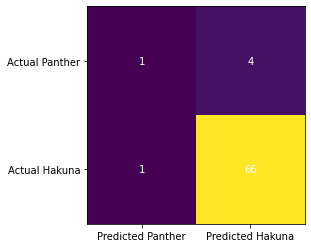

In [ ]:
cm_rfc = confusion_matrix(y_v, rfc_val)

fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(cm_rfc)
ax.grid(False)
ax.xaxis.set(ticks=(True,False), ticklabels=('Predicted Hakuna', 'Predicted Panther'))
ax.yaxis.set(ticks=(True,False), ticklabels=('Actual Hakuna', 'Actual Panther'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm_rfc[i, j], ha='center', va='center', color='white')
plt.show()

In [ ]:
print(classification_report(y_v, rfc_val))
print(precision_recall_fscore_support(y_v, rfc_val, average='macro'))

              precision    recall  f1-score   support

           0       0.50      0.20      0.29         5
           1       0.94      0.99      0.96        67

    accuracy                           0.93        72
   macro avg       0.72      0.59      0.62        72
weighted avg       0.91      0.93      0.92        72

(0.7214285714285714, 0.5925373134328358, 0.6246089676746611, None)


### Tempo, pitch_std, spectral centroid and FFT
The accuracy is high here, and the reason is that the model predicts all the samples to be Hakuna. The confusion matrix is proof of this. The macro average f1-score is lower than before.

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
rfc.fit(X_t2, y_t)

rfc_train = rfc.predict(X_t2)
rfc_val = rfc.predict(X_v2)

print('Training Accuracy', np.mean(rfc_train==y_t))
print('Validation Accuracy', np.mean(rfc_val==y_v))

Training Accuracy 0.8812487601666336
Validation Accuracy 0.9305555555555556


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


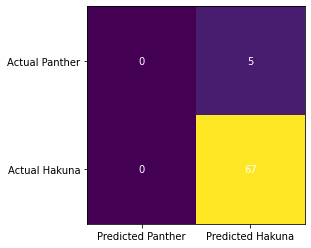

In [ ]:
cm_rfc = confusion_matrix(y_v, rfc_val)

fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(cm_rfc)
ax.grid(False)
ax.xaxis.set(ticks=(True,False), ticklabels=('Predicted Hakuna', 'Predicted Panther'))
ax.yaxis.set(ticks=(True,False), ticklabels=('Actual Hakuna', 'Actual Panther'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm_rfc[i, j], ha='center', va='center', color='white')
plt.show()

In [ ]:
print(classification_report(y_v, rfc_val))
print(precision_recall_fscore_support(y_v, rfc_val, average='macro'))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.93      1.00      0.96        67

    accuracy                           0.93        72
   macro avg       0.47      0.50      0.48        72
weighted avg       0.87      0.93      0.90        72

(0.4652777777777778, 0.5, 0.48201438848920863, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

### Tempo, spectral centroid and FFT
After dropping more features, the macro f1-score goes up again. The model now can predict one correct Panther label without misclassifying any Hakuna. This is the best model so far.

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
rfc.fit(X_t3, y_t)

rfc_train = rfc.predict(X_t3)
rfc_val = rfc.predict(X_v3)

print('Training Accuracy', np.mean(rfc_train==y_t))
print('Validation Accuracy', np.mean(rfc_val==y_v))

Training Accuracy 0.8812487601666336
Validation Accuracy 0.9185956790123457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


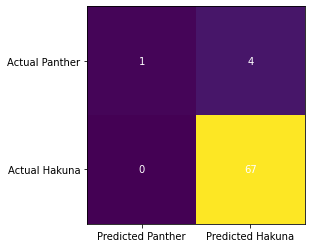

In [ ]:
cm_rfc = confusion_matrix(y_v, rfc_val)

fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(cm_rfc)
ax.grid(False)
ax.xaxis.set(ticks=(True,False), ticklabels=('Predicted Hakuna', 'Predicted Panther'))
ax.yaxis.set(ticks=(True,False), ticklabels=('Actual Hakuna', 'Actual Panther'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm_rfc[i, j], ha='center', va='center', color='white')
plt.show()

In [ ]:
print(classification_report(y_v, rfc_val))
print(precision_recall_fscore_support(y_v, rfc_val, average='macro'))

              precision    recall  f1-score   support

           0       1.00      0.20      0.33         5
           1       0.94      1.00      0.97        67

    accuracy                           0.94        72
   macro avg       0.97      0.60      0.65        72
weighted avg       0.95      0.94      0.93        72

(0.971830985915493, 0.6, 0.6521739130434783, None)


The feature importances depend on the decrease in the impurity of the feature being the element to classify the data. The more it helps reduce the impurity, the more important the feature is.


258    0.039830
97     0.037530
87     0.030857
191    0.028073
190    0.023893
         ...   
151    0.000000
273    0.000000
149    0.000000
275    0.000000
170    0.000000
Length: 344, dtype: float64


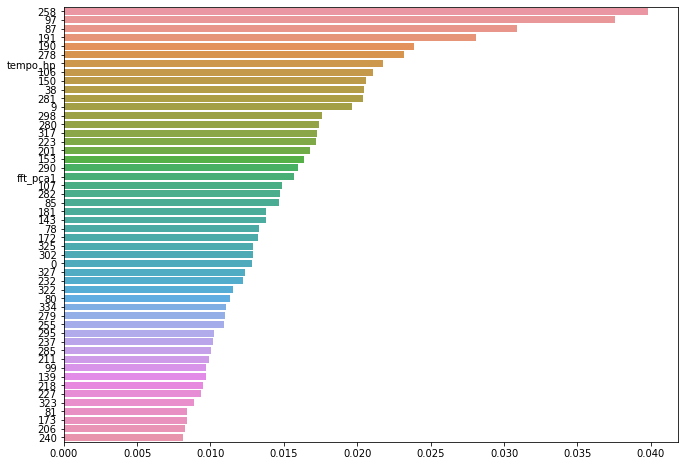

In [ ]:
feature_imp = pd.Series(rfc.feature_importances_,index=X_t3.columns).sort_values(ascending=False)
print(feature_imp)
fig, ax = plt.subplots()
fig.set_size_inches(11, 8)
sns.barplot(x=feature_imp[:50], y=feature_imp.index[:50])

### Spectral centroid

According to the Feature importances, many of the features of spectral centroid appears to be important for random forests. Drop the other features and only try it with the spectral centroid here.



In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
rfc.fit(train_centroid, y_t)

rfc_train = rfc.predict(train_centroid)
rfc_val = rfc.predict(val_centroid)

print('Training Accuracy', np.mean(rfc_train==y_t))
print('Validation Accuracy', np.mean(rfc_val==y_v))

Training Accuracy 0.8842987502479667
Validation Accuracy 0.8946759259259259


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


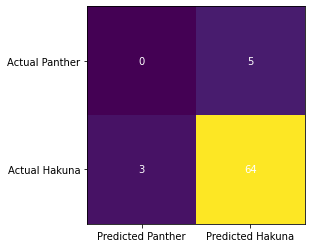

In [ ]:
cm_rfc = confusion_matrix(y_v, rfc_val)

fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(cm_rfc)
ax.grid(False)
ax.xaxis.set(ticks=(True,False), ticklabels=('Predicted Hakuna', 'Predicted Panther'))
ax.yaxis.set(ticks=(True,False), ticklabels=('Actual Hakuna', 'Actual Panther'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm_rfc[i, j], ha='center', va='center', color='white')
plt.show()

In [ ]:
print(classification_report(y_v, rfc_val))
print(precision_recall_fscore_support(y_v, rfc_val, average='macro'))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.93      0.96      0.94        67

    accuracy                           0.89        72
   macro avg       0.46      0.48      0.47        72
weighted avg       0.86      0.89      0.88        72

(0.463768115942029, 0.47761194029850745, 0.47058823529411764, None)


## Test on test set


In [ ]:
X_test = X_test.drop(['fft_hp','spectral_centroid','pitch_mean','power','pitch_std'], axis= 1)
X_test = pd.concat([X_test,test_centroid,test_fft_pca['fft_pca1'],test_fft_pca['fft_pca2']], axis=1)
y_test = np.where(y_test=='Hakuna',1,0)

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
rfc.fit(X_t3, y_t)

rfc_train = rfc.predict(X_t3)
rfc_test = rfc.predict(X_test)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


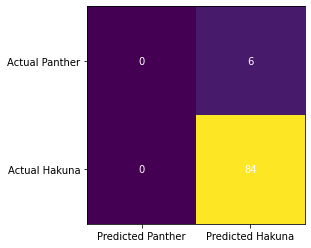

In [ ]:
cm_test = confusion_matrix(y_test, rfc_test)

fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(cm_test)
ax.grid(False)
ax.xaxis.set(ticks=(True,False), ticklabels=('Predicted Hakuna', 'Predicted Panther'))
ax.yaxis.set(ticks=(True,False), ticklabels=('Actual Hakuna', 'Actual Panther'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm_test[i, j], ha='center', va='center', color='white')
plt.show()

In [ ]:
print(classification_report(y_test, rfc_test))
print(precision_recall_fscore_support(y_test, rfc_test, average='macro'))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.93      1.00      0.97        84

    accuracy                           0.93        90
   macro avg       0.47      0.50      0.48        90
weighted avg       0.87      0.93      0.90        90

(0.4666666666666667, 0.5, 0.4827586206896552, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

#Reference

https://towardsdatascience.com/fast-fourier-transform-937926e591cb

https://numpy.org/doc/stable/reference/routines.fft.html#module-numpy.fft

https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

https://scikit-learn.org/stable/supervised_learning.html#supervised-learning

